# Object Detection
This notebook will serve as the primary means of documentation for creating an object detection model
_______________________________________________________________________________________________________________________________________________

### Full group includes:
- Jordan Brown
- Dylan Roy
- Maxwell Barret
- Julia Dewhurt

### Primary notebook contributers:
- ""
- ""
_______________________________________________________________________________________________________________________________________________

***The primary notebook contributers are the group members who were assigned to this specific task. All group members will work in collaboration to create a final working product. However, the nature of this project calls for the full group to be assigned to primary tasks.***

## Notebook Goal/Purpose

This notebook will be used to create a model for traffic based object detection. This will involve using labeled image and video feeds to determine what traffic objects look like. This model will be able to detect and track traffic counts at individual intersections. This tracking will be used to create a dataset which can hopefully be used to train a traffic prediction for the traffic analysis portion of this project.
_______________________________________________________________________________________________________________________________________________

Code cells should use the following layout template
```
"""
At the top will be a commment block
this comment block will describe the
primary purpose for the cells code.
"""

# A comment stating used libary(s)

Code
    Implementation
        Goes
            Here

```

In [28]:
"""
This cell will contain the import statements for the notebook.
"""
from kaggle.api.kaggle_api_extended import KaggleApi
import os
import json
import pandas as pd

In [29]:
# from kaggle.api.kaggle_api_extended import KaggleApi
# import os

# Initialize the API
api = KaggleApi()
api.authenticate()

# Dataset details
dataset = "imtkaggleteam/city-intersection-computer-vision"
download_path = "dataset"  # Desired directory

# Ensure the download path exists
if not os.path.exists(download_path):
    os.makedirs(download_path, exist_ok=True)

    # Download the dataset
    api.dataset_download_files(dataset, path=download_path, unzip=True)

    print(f"Dataset downloaded to: {os.path.abspath(download_path)}")

In [30]:
import sys, os, distutils.core
from IPython.display import clear_output

!python -m pip install pyyaml==5.1
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

In [31]:
# Importing dependencies

import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("detectron2 version:", detectron2.__version__)

import numpy as np
import pandas as pd
import os, json, cv2, random
from IPython import display
import PIL
import matplotlib.pyplot as plt

# importing detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


SEED = 12
THRESHOLD = 0.9

In [32]:
# a function that used for creation a coco json file from a csv file
# original reference -> https://stackoverflow.com/questions/62545034/how-to-convert-a-csv-table-into-coco-format-in-python

def create_csv_to_coco(path, save_json_path):
    data = pd.read_csv(path)
    data = data[['filename','class','width', 'height','xmin','ymin','xmax','ymax']]

    images = []
    categories = []
    annotations = []

    category = {}
    category["supercategory"] = 'none'
    category["id"] = 0
    category["name"] = 'None'
    categories.append(category)

    data['fileid'] = data['filename'].astype('category').cat.codes
    data['categoryid']= pd.Categorical(data['class'],ordered= True).codes
    data['categoryid'] = data['categoryid']+1
    data['annid'] = data.index
    
    def image(row):
        image = {}
        image["height"] = row.height
        image["width"] = row.width
        image["id"] = row.fileid
        image["file_name"] = row.filename
        return image

    def category(row):
        category = {}
        category["supercategory"] = 'None'
        category["id"] = row.categoryid
        category["name"] = row[2]
        return category

    def annotation(row):
        annotation = {}
        area = (row.xmax -row.xmin)*(row.ymax - row.ymin)
        annotation["segmentation"] = []
        annotation["iscrowd"] = 0
        annotation["area"] = area
        annotation["image_id"] = row.fileid

        annotation["bbox"] = [row.xmin, row.ymin, row.xmax -row.xmin,row.ymax-row.ymin ]

        annotation["category_id"] = row.categoryid
        annotation["id"] = row.annid
        return annotation

    for row in data.itertuples():
        annotations.append(annotation(row))

    imagedf = data.drop_duplicates(subset=['fileid']).sort_values(by='fileid')
    for row in imagedf.itertuples():
        images.append(image(row))

    catdf = data.drop_duplicates(subset=['categoryid']).sort_values(by='categoryid')
    for row in catdf.itertuples():
        categories.append(category(row))

    data_coco = {}
    data_coco["images"] = images
    data_coco["categories"] = categories
    data_coco["annotations"] = annotations
    json.dump(data_coco, open(save_json_path, "w"), indent=4)
    print( save_json_path ,' file created...')

In [33]:
create_csv_to_coco(f'{download_path}/train/_annotations.csv', 
                   'dataset/train_coco.json')
create_csv_to_coco(f'{download_path}/valid/_annotations.csv', 
                   'dataset/valid_coco.json')
create_csv_to_coco(f'{download_path}/test/_annotations.csv', 
                   'dataset/test_coco.json')


dataset/train_coco.json  file created...
dataset/valid_coco.json  file created...
dataset/test_coco.json  file created...


In [34]:
# Creating coco instances

from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode

    
register_coco_instances(f"city_intersection_train_dataset", {},
                        f"/home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/train_coco.json",
                        f"/home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/train")

register_coco_instances(f"city_intersection_valid_dataset", {},
                        f"/home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/valid_coco.json",
                        f"/home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/valid")

register_coco_instances(f"city_intersection_test_dataset", {},
                        f"/home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/test_coco.json",
                        f"/home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/test")


In [35]:
# Examples from the training dataset

import random
from detectron2.utils.visualizer import Visualizer

my_dataset_train_metadata = MetadataCatalog.get("city_intersection_train_dataset")
train_dataset_dicts = DatasetCatalog.get("city_intersection_train_dataset")

# A function that creates examples from the dataset
def create_random_images(dataset_dict,dataset_metadata, seed, image_scale = 0.7):
    np.random.seed(seed)
    images = np.random.permutation(dataset_dict)[:2]
    
    fig, axs = plt.subplots(1,2, figsize = (12,6), dpi = 100)
    for i in range(2):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        vis = visualizer.draw_dataset_dict(im)
        final_img = vis.get_image()
        
        axs[i].set_title('image id: ' + str(img_id), fontsize = 10)
        axs[i].axis('off')
        axs[i].imshow(final_img)

WARNING [11/19 13:12:01 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/19 13:12:01 d2.data.datasets.coco]: Loaded 1320 images in COCO format from /home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/train_coco.json


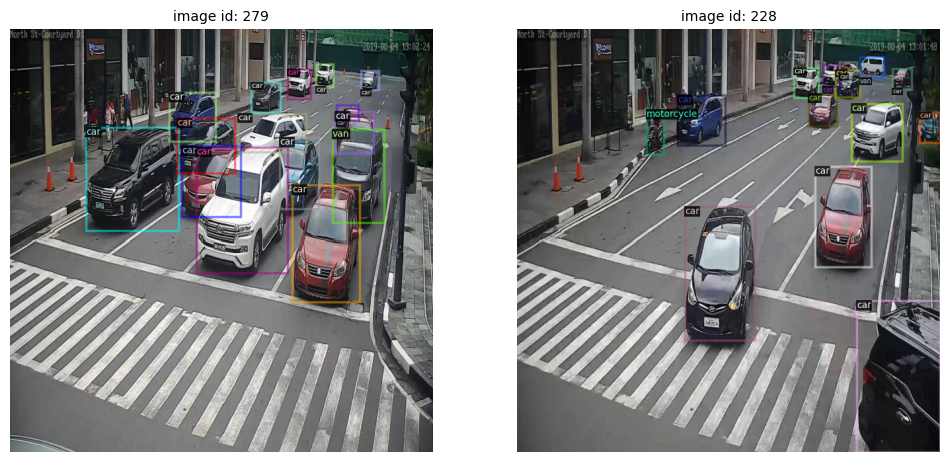

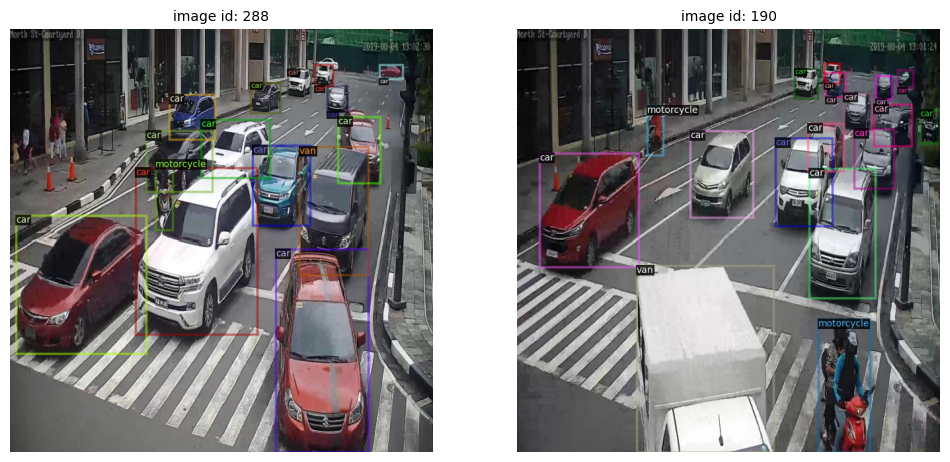

In [36]:
# Examples from the training dataset

create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 92, image_scale = 1)
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 1, image_scale = 1)

In [ ]:
# from detectron2.engine import DefaultTrainer

# EPOCHS = 6000
# NUM_CLASSES = 7
# BASE_LR = 0.00001

# cfg = get_cfg()
# cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
# cfg.DATASETS.TRAIN = ('city_intersection_train_dataset')
# cfg.DATASETS.TEST = ()
# cfg.DATALOADER.NUM_WORKERS = 2
# cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  
# cfg.SOLVER.IMS_PER_BATCH = 2
# cfg.SOLVER.BASE_LR = BASE_LR  
# cfg.SOLVER.MAX_ITER = EPOCHS    
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

# os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# # uncomment below to train
# trainer = DefaultTrainer(cfg) 
# trainer.resume_or_load(resume=False)
# trainer.train()

[11/19 13:12:04 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (28, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (28,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, 

[11/19 13:12:06 d2.engine.train_loop]: Starting training from iteration 0
[11/19 13:12:17 d2.utils.events]:  eta: 0:55:05  iter: 19  total_loss: 2.915  loss_cls: 1.921  loss_box_reg: 0.8893  loss_rpn_cls: 0.04115  loss_rpn_loc: 0.04887    time: 0.5361  last_time: 0.5622  data_time: 0.0164  last_data_time: 0.0094   lr: 1.9981e-07  max_mem: 1896M
[11/19 13:12:28 d2.utils.events]:  eta: 0:54:37  iter: 39  total_loss: 2.864  loss_cls: 1.917  loss_box_reg: 0.8809  loss_rpn_cls: 0.03127  loss_rpn_loc: 0.04182    time: 0.5436  last_time: 0.5241  data_time: 0.0078  last_data_time: 0.0078   lr: 3.9961e-07  max_mem: 1898M
[11/19 13:12:40 d2.utils.events]:  eta: 0:55:02  iter: 59  total_loss: 2.881  loss_cls: 1.915  loss_box_reg: 0.8875  loss_rpn_cls: 0.04044  loss_rpn_loc: 0.04916    time: 0.5535  last_time: 0.5378  data_time: 0.0079  last_data_time: 0.0075   lr: 5.9941e-07  max_mem: 1898M
[11/19 13:12:52 d2.utils.events]:  eta: 0:55:16  iter: 79  total_loss: 2.869  loss_cls: 1.9  loss_box_reg: 

In [ ]:
# # Saving the model

# cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
# predictor = DefaultPredictor(cfg)

# import pickle
# with open("cfg.pkl", "wb") as f:
#     pickle.dump(cfg, f)

[11/19 14:17:27 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/home/brownjordan317/.local/lib/python3.10/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=tor

In [41]:
# original code from https://eidos-ai.medium.com/training-on-detectron2-with-a-validation-set-and-plot-loss-on-it-to-avoid-overfitting-6449418fbf4e

def reading_metrics_from_json(metrics_path):
    metrics = []
    
    with open(metrics_path, 'r') as f:
        for line in f:
            metrics.append(json.loads(line))
    return metrics


def metric(metrics, specific_metric):
    metric_values = []
    
    # Iterate through each metric entry in metrics
    for i in range(len(metrics)):
        # Check if the specific_metric exists in the current entry
        if specific_metric in metrics[i]:
            metric_values.append(metrics[i][specific_metric])
        else:
            print(f"Key '{specific_metric}' not found in metrics at index {i}")
            # If the key is missing, fill with the average of the existing values
            # Calculate the average of existing values in the metric_values
            if metric_values:
                avg_value = np.mean(metric_values)
                metric_values.append(avg_value)
            else:
                # If metric_values is empty, just append a default value (e.g., 0 or NaN)
                metric_values.append(0)
    
    return metric_values

# def metric(metrics, specific_metric):
#     metric = []
#     for i in range(len(metrics)):
#         metric.append(metrics[i][specific_metric])
#     return metric

In [42]:
train_metrics = reading_metrics_from_json('/home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/output/metrics.json')
print(train_metrics)
num_fed = 0
total = 0
for i in range(len(train_metrics)):
    count = 0
    for key, value in train_metrics[i].items():
        if key == 'iteration':
            count += 1
        if key == 'total_loss':
            count += 1
        if key == 'fast_rcnn/cls_accuracy':
            count += 1
        if key == 'fast_rcnn/false_negative':
            count += 1
        if key == 'loss_box_reg':
            count += 1
        if count != 5:
            num_fed += 1
        count = 0
        total += 1
print(total)
print(num_fed)
iters = metric(train_metrics, 'iteration')
total_loss = metric(train_metrics, 'total_loss')
cls_acc = metric(train_metrics, 'fast_rcnn/cls_accuracy')
false_neg = metric(train_metrics, 'fast_rcnn/false_negative')
loss_box_reg = metric(train_metrics, 'loss_box_reg')

[{'data_time': 0.00711658400041415, 'eta_seconds': 3281.650977671161, 'fast_rcnn/cls_accuracy': 0.04052734375, 'fast_rcnn/false_negative': 0.09375, 'fast_rcnn/fg_cls_accuracy': 0.033203125, 'iteration': 19, 'loss_box_reg': 0.8929557204246521, 'loss_cls': 2.137107729911804, 'loss_rpn_cls': 0.04152088612318039, 'loss_rpn_loc': 0.050721438601613045, 'lr': 1.9981000000000001e-07, 'rank_data_time': 0.00711658400041415, 'roi_head/num_bg_samples': 384.0, 'roi_head/num_fg_samples': 128.0, 'rpn/num_neg_anchors': 200.25, 'rpn/num_pos_anchors': 55.75, 'time': 0.5487710665001941, 'total_loss': 3.128293229267001}, {'data_time': 0.007287289500254701, 'eta_seconds': 3306.2058072829313, 'fast_rcnn/cls_accuracy': 0.037109375, 'fast_rcnn/false_negative': 0.09680792297979798, 'fast_rcnn/fg_cls_accuracy': 0.020923520923520924, 'iteration': 39, 'loss_box_reg': 0.8565164506435394, 'loss_cls': 2.1366350650787354, 'loss_rpn_cls': 0.038652876392006874, 'loss_rpn_loc': 0.03782178647816181, 'lr': 3.9961e-07, 'ra

Text(0.5, 1.0, 'False Negative')

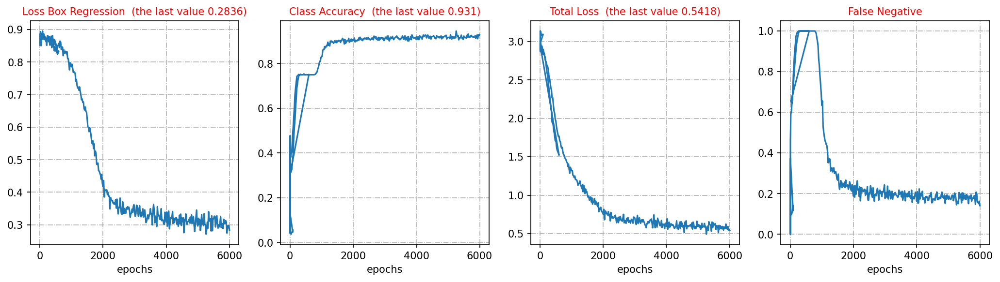

In [43]:
fig, axs = plt.subplots(1,4, figsize = (17, 4), dpi = 150)

axs[0].grid(linestyle = 'dashdot')
axs[0].plot(iters, loss_box_reg)
axs[0].set_xlabel('epochs', fontsize = 10)
axs[0].set_title('Loss Box Regression', fontsize = 10)
tit0 = ' (the last value {0:.4f})'.format(loss_box_reg[-1])
axs[0].set_title('Loss Box Regression ' + tit0, fontsize = 10, color = 'red')

axs[1].grid(linestyle = 'dashdot')
axs[1].plot(iters, cls_acc)
axs[1].set_xlabel('epochs', fontsize = 10)
tit1 = ' (the last value {0:.3f})'.format(cls_acc[-1])
axs[1].set_title('Class Accuracy ' + tit1, fontsize = 10, color = 'red')

axs[2].grid(linestyle = 'dashdot')
axs[2].plot(iters, total_loss)
axs[2].set_xlabel('epochs', fontsize = 10)
tit2 = ' (the last value {0:.4f})'.format(total_loss[-1])
axs[2].set_title('Total Loss ' + tit2, fontsize = 10, color = 'red')

axs[3].grid(linestyle = 'dashdot')
axs[3].plot(iters, false_neg)
axs[3].set_xlabel('epochs', fontsize = 10)
axs[3].set_title('False Negative', fontsize = 10, color = 'red')


In [44]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("city_intersection_valid_dataset", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "city_intersection_valid_dataset")
inference_on_dataset(trainer.model, test_loader, evaluator)

[11/19 14:19:18 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [11/19 14:19:19 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/19 14:19:19 d2.data.datasets.coco]: Loaded 391 images in COCO format from /home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/valid_coco.json
[11/19 14:19:22 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/19 14:19:22 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/19 14:19:22 d2.data.common]: Serializing 391 elements to byte tensors and concatenating them all ...
[11/19 14:19:22 d2.data.common]: Serialized dataset takes 0.26 MiB
[11/19 14:19:22 d2.evaluation.evaluator]: Start inference on 391 batches
[11/19 14:19:24 d2.evaluation.eva

OrderedDict([('bbox',
              {'AP': 15.386635101721225,
               'AP50': 23.18858247301265,
               'AP75': 16.639886524050088,
               'APs': 14.61088790383977,
               'APm': 15.996231760861566,
               'APl': 19.64259184600522,
               'AP-None': nan,
               'AP-bus': 0.0,
               'AP-car': 71.65958593302845,
               'AP-jeepney': 0.0,
               'AP-motorcycle': 20.660224677298896,
               'AP-truck': 0.0,
               'AP-van': 0.0})])

In [45]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("city_intersection_test_dataset", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "city_intersection_test_dataset")
inference_on_dataset(trainer.model, test_loader, evaluator)

[11/19 14:21:24 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [11/19 14:21:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/19 14:21:24 d2.data.datasets.coco]: Loaded 188 images in COCO format from /home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/test_coco.json
[11/19 14:21:25 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/19 14:21:25 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[11/19 14:21:25 d2.data.common]: Serializing 188 elements to byte tensors and concatenating them all ...
[11/19 14:21:25 d2.data.common]: Serialized dataset takes 0.13 MiB
[11/19 14:21:25 d2.evaluation.evaluator]: Start inference on 188 batches
[11/19 14:21:27 d2.evaluation.eval

OrderedDict([('bbox',
              {'AP': 16.150834937992958,
               'AP50': 24.45288089492948,
               'AP75': 17.2283872690371,
               'APs': 15.01714912691904,
               'APm': 17.499028112619364,
               'APl': 15.224818212685975,
               'AP-None': nan,
               'AP-bus': 0.0,
               'AP-car': 71.96282295552182,
               'AP-jeepney': 0.0,
               'AP-motorcycle': 24.942186672435952,
               'AP-truck': 0.0,
               'AP-van': 0.0})])

In [46]:
my_dataset_test_metadata = MetadataCatalog.get("city_intersection_test_dataset")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("city_intersection_test_dataset")


# A function for plotting an original image's bbox and predicted bbox
def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]
    
    fig, axs = plt.subplots(3,2, figsize = (20,20), dpi = 120)
    
    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()
        
        visualizer2 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
        
        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 20)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)
        
        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 20, color = 'red')
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox)
        
    fig.tight_layout()

WARNING [11/19 14:22:00 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



[11/19 14:22:00 d2.data.datasets.coco]: Loaded 188 images in COCO format from /home/brownjordan317/fall_2024/CSCI443/Github/CSCI-443/object_detection/dataset/test_coco.json


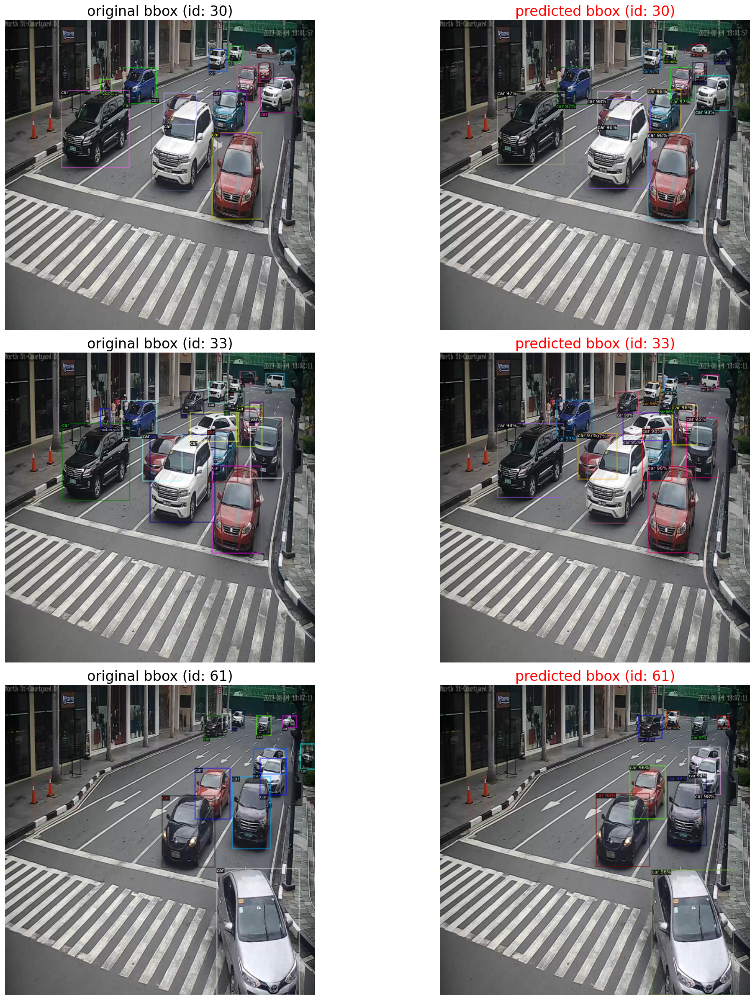

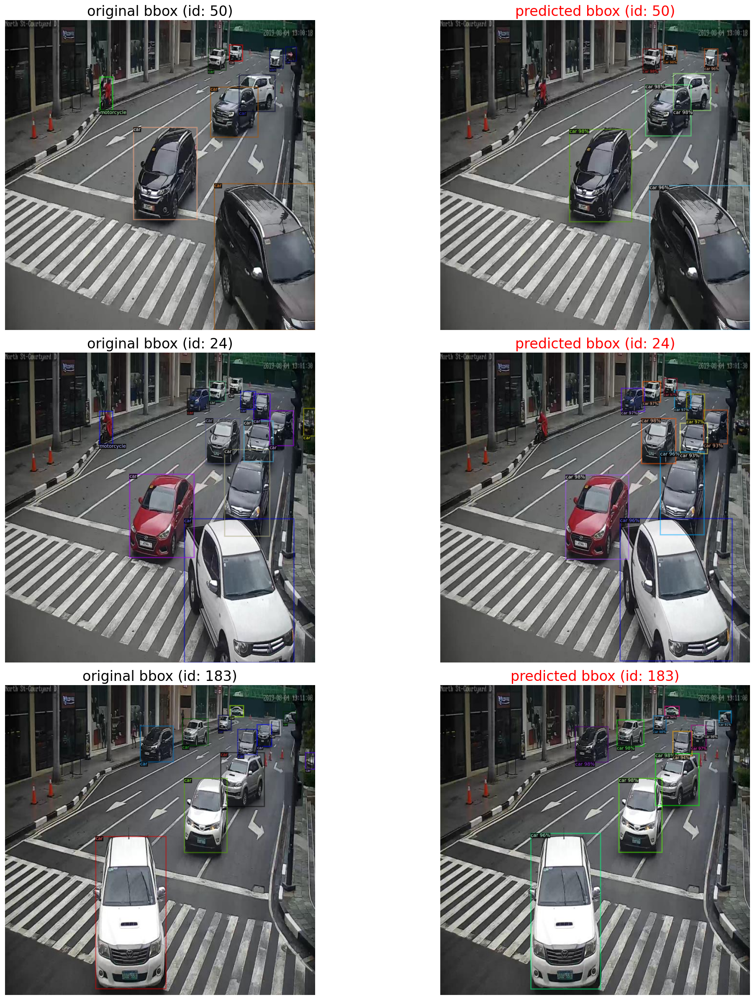

In [47]:
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 78, image_scale = 2)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 99, image_scale = 2)